In [1]:
%load_ext autoreload

In [2]:
%autoreload 2
%reset -f -s
import logging
import random
import numpy as np
import pandas as pd
from pathlib import Path

from PIL import ImageDraw, ImageFont, Image
from datasets import ClassLabel, load_dataset, Features, Image as DsImage, Value
from skrub import TableReport

from digression_code import (show_examples, show_predictions, Task, PTModel, FTModel, ImageFolderDataset, load_annotations_csv)
logging.basicConfig(level=logging.INFO)
logging.getLogger("matplotlib").setLevel(logging.CRITICAL)
logging.getLogger("PIL").setLevel(logging.CRITICAL)

In [3]:

task = Task("crop_height")
#df = load_annotations_csv(f"wrong_crop_model/62340e30573f02a7303dd8b6.alth/annotations.csv")
#TableReport(df)

In [4]:
ds = load_dataset(
    "imagefolder", data_dir=f"ifd-data/{task.name}",
    features=Features({'image': DsImage(),
                        'labels': task.labels,
                        'id': Value(dtype='string')}),
)
ds

Resolving data files:   0%|          | 0/30001 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/7001 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'labels', 'id'],
        num_rows: 30000
    })
    test: Dataset({
        features: ['image', 'labels', 'id'],
        num_rows: 7000
    })
})

In [5]:
from digression_code import CLIssues
# import pandas as pd
from sklearn.metrics import classification_report


split = "test"
clissues = CLIssues.find_issues(
    f"ifd-data/{task.name}", f"predictions/{task.name}/{split}.csv", split, task
)
pd.DataFrame(classification_report(y_true=clissues.predictions_df.y_tilde, y_pred=clissues.predictions_df.y_hat, target_names=task.labels.names, output_dict=True) )


Resolving data files:   0%|          | 0/30001 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/7001 [00:00<?, ?it/s]

Finding label issues ...
Finding outlier issues ...
Fitting OOD estimator based on provided pred_probs ...
Finding non_iid issues ...
Finding class_imbalance issues ...

Audit complete. 131 issues found in the dataset.


,SMALL,LARGE,accuracy,macro avg,weighted avg
precision,0.991938,0.947368,0.986857,0.969653,0.986806
recall,0.993219,0.937965,0.986857,0.965592,0.986857
f1-score,0.992578,0.942643,0.986857,0.967611,0.986829
support,6194.000000,806.000000,0.986857,7000.000000,7000.000000


In [6]:
clissues.lab.report()

Dataset Information: num_examples: 7000, num_classes: 2

Here is a summary of various issues found in your data:

issue_type  num_issues
   outlier         108
     label          22
   non_iid           1

Learn about each issue: https://docs.cleanlab.ai/stable/cleanlab/datalab/guide/issue_type_description.html
See which examples in your dataset exhibit each issue via: `datalab.get_issues(<ISSUE_NAME>)`

Data indices corresponding to top examples of each issue are shown below.


---------------------- outlier issues ----------------------

About this issue:
	Examples that are very different from the rest of the dataset 
    (i.e. potentially out-of-distribution or rare/anomalous instances).
    

Number of examples with this issue: 108
Overall dataset quality in terms of this issue: 0.6257

Examples representing most severe instances of this issue:
      is_outlier_issue  outlier_score
603               True       0.000027
632               True       0.000041
3397              True  

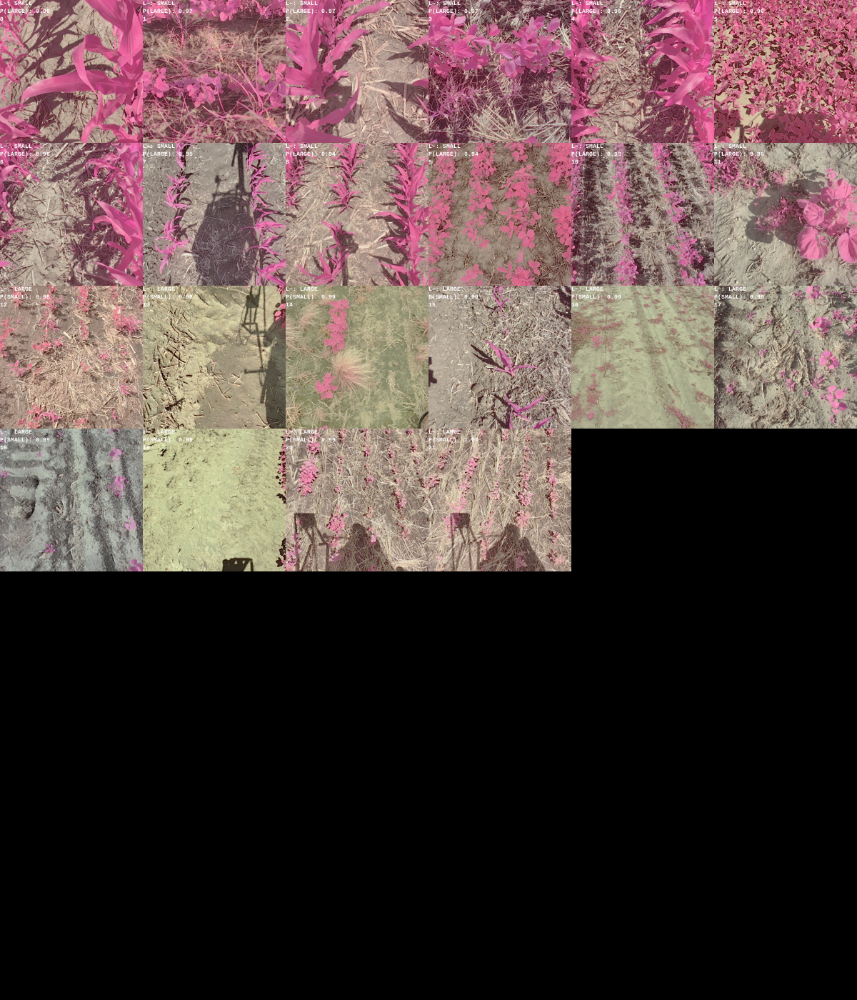

In [7]:


def show_issues(task: Task, pred_df: pd.DataFrame, sample_n=9, col_wrap=2, size=(350, 350)):

    w, h = size
    grid = Image.new('RGB', size=(col_wrap * w, (sample_n // col_wrap + sample_n % col_wrap) * h))
    draw = ImageDraw.Draw(grid)
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf", 8)


    for i, (_, row) in enumerate(pred_df.sample(n=sample_n).sort_values(by=["y_tilde", task.labels.names[0]]).iterrows()):
        image = Image.open(Path(row.abs_path))

        ex_label = f"L~: {task.labels.int2str(row["y_tilde"])}"
        pred_label = task.labels.int2str(row["y_hat"])
        pred_score = row[f"{pred_label}"]
        ex_pred = f"P({task.labels.int2str(row["y_hat"])}): {pred_score:.2f}"

        box = (i % col_wrap * w, i // col_wrap * h)
        grid.paste(image.resize(size), box=box)
        draw.multiline_text(box, f"{ex_label}\n{ex_pred}\n{i}", (255, 255, 255), font=font)

    return grid


issue_name = "label"
show_issues(clissues.task, clissues.get_issue_df(issue_name), sample_n=22, col_wrap=6, size=(200, 200))
# show_issues(clissues.task, clissues.predictions_df.loc[lambda x: x.y_hat != x.y_tilde], sample_n=90, col_wrap=10, size=(150, 150))


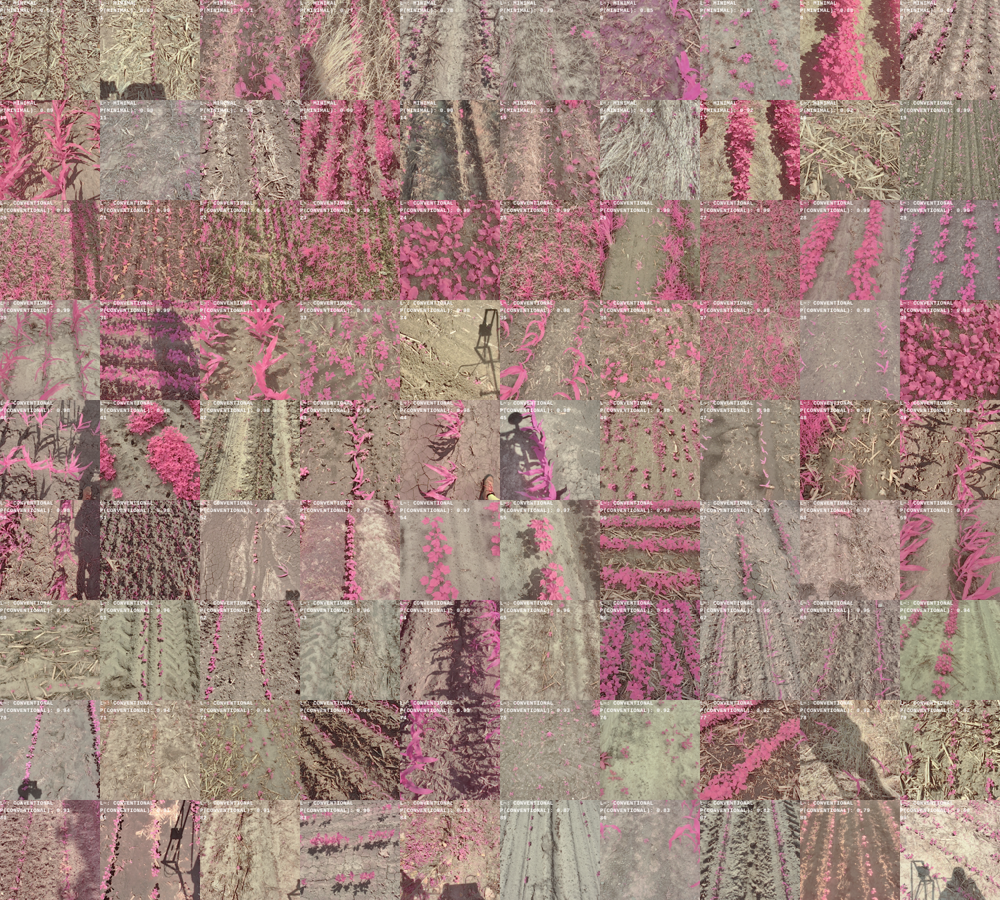

In [63]:
show_issues(clissues.task, clissues.predictions_df.loc[lambda x: x.y_hat == x.y_tilde],  sample_n=90, col_wrap=10, size=(150, 150))

## Below is one way to show the initial aletheia dataset

In [ ]:
import pandas as pd
from skrub import TableReport
keep_cols = [
    'angle_to_row',  # DONE
    'cloud_cover',   # DONE
    'crop_damage',
    'crop_health',
    'crop_height',   # DONE
    'crop_name',     # DONE
    'crop_residue',  # DONE
    'crop_residue_type',
    'row_spacing',   # DONE
    # 'soil_color',  # Bad results/data
    'soil_moisture',
    'tillage_practice', # DONE
    # 'weed_pressure',
    'weeds',
]

#_df = pd.read_csv("wrong_crop_model/62340e30573f02a7303dd8b6.alth/annotations.csv")[keep_cols]#.drop(columns=["id", "file_name"])
_df = pd.read_csv("wrong_crop_model/62340e30573f02a7303dd8b6.angle_to_row/train/metadata.csv")
TableReport(_df)


Processing column  14 / 14


,,,,,,,,,,,,,,


In [ ]:
_df.loc[lambda x: x.id == '5eeb8f856e4ced6de9c32b0c']

,id,file_name,labels,cloud_cover,crop_damage,crop_health,crop_height,crop_name,crop_residue,crop_residue_type,row_spacing,soil_moisture,tillage_practice,weeds
83,5eeb8f856e4ced6de9c32b0c,ANGLED/5eeb8f856e4ced6de9c32b0c.png,ANGLED,OVERCAST,['NONE'],HEALTHY,MEDIUM,SOYBEANS,MEDIUM,NaN,INCHES_30,NaN,CONVENTIONAL,"['OTHER_BROADLEAF', 'VELVETLEAF', 'VOLUNTEER_C..."
84,5eeb8f856e4ced6de9c32b0c,ANGLED/5eeb8f856e4ced6de9c32b0c.png,ANGLED,OVERCAST,['NONE'],HEALTHY,MEDIUM,SOYBEANS,MEDIUM,NaN,INCHES_30,NaN,CONVENTIONAL,"['OTHER_BROADLEAF', 'VELVETLEAF', 'VOLUNTEER_C..."
85,5eeb8f856e4ced6de9c32b0c,ANGLED/5eeb8f856e4ced6de9c32b0c.png,ANGLED,OVERCAST,['NONE'],HEALTHY,MEDIUM,SOYBEANS,MEDIUM,NaN,INCHES_30,NaN,CONVENTIONAL,"['OTHER_BROADLEAF', 'VELVETLEAF', 'VOLUNTEER_C..."
86,5eeb8f856e4ced6de9c32b0c,ANGLED/5eeb8f856e4ced6de9c32b0c.png,ANGLED,OVERCAST,['NONE'],HEALTHY,MEDIUM,SOYBEANS,MEDIUM,NaN,INCHES_30,NaN,CONVENTIONAL,"['OTHER_BROADLEAF', 'VELVETLEAF', 'VOLUNTEER_C..."
